In [1]:
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from numpy import cos, sin, arange, pi
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import plot, show, xlim, ylim, gca, rcParams
g = 9.81     # [m/s^2]. Gravitational acceleration
figsize = 6
dpi = 600

def RHS(z, t, L1, L2, m1, m2, g):
    """ 
    Return the right hand side of the 
    ODE describing the motion of the double pendulum.
    """
    theta1, w1, theta2, w2 = z
    cos12 = cos(theta1 - theta2)
    sin12 = sin(theta1 - theta2)
    sin1 = sin(theta1)
    sin2 = sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot

def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ 
    Transforms theta and omega to 
    cartesian coordinates: x1, y1, x2, y2
    velocities: vx1, vy1, vx2, vy2
    """
    x1 = L1 * sin(theta1)
    y1 = -L1 * cos(theta1)
    x2 = x1 + L2 * sin(theta2)
    y2 = y1 - L2 * cos(theta2)
    vx1 = L1*cos(theta1)*w1
    vy1 = L1*sin(theta1)*w1
    vx2 = vx1 + L2*cos(theta2)*w2
    vy2 = vy1 + L2*sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2


def plot_position(x1, y1, x2, y2, theta1, theta2, t):
    """
    Plot the trajectory of mass 1 and mass 2 from the given
    x1, y1, x2, y2, theta1, theta2, t
    """
    rcParams['figure.figsize']=[20,20]
    ax = gca()
    ax.set_aspect('equal')
    L = L1 + L2
    plt.xlim(-L,L)
    plt.ylim(-L,L)
    ax.plot(x1, y1, label=r"Track $m_1$", c = "orange")
    ax.plot(x2, y2, label=r"Track $m_2$", c = "red")
    ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
    plt.ylabel(r"$y/L$")
    plt.xlabel(r"$x/L$")
    ax.legend()
def plot_position1(x1, y1, x2, y2, theta1, theta2, t):
    rcParams['figure.figsize']=[20,20]
    ax = gca()
    ax.set_aspect('equal')
    L = L1 + L2
    plt.xlim(-L,L)
    plt.ylim(-L,L)
    ax.plot(x2, y2, label=r"Track $m_2'$", c = "g")
    ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
    plt.ylabel(r"$y/L$")
    plt.xlabel(r"$x/L$")
    ax.legend()

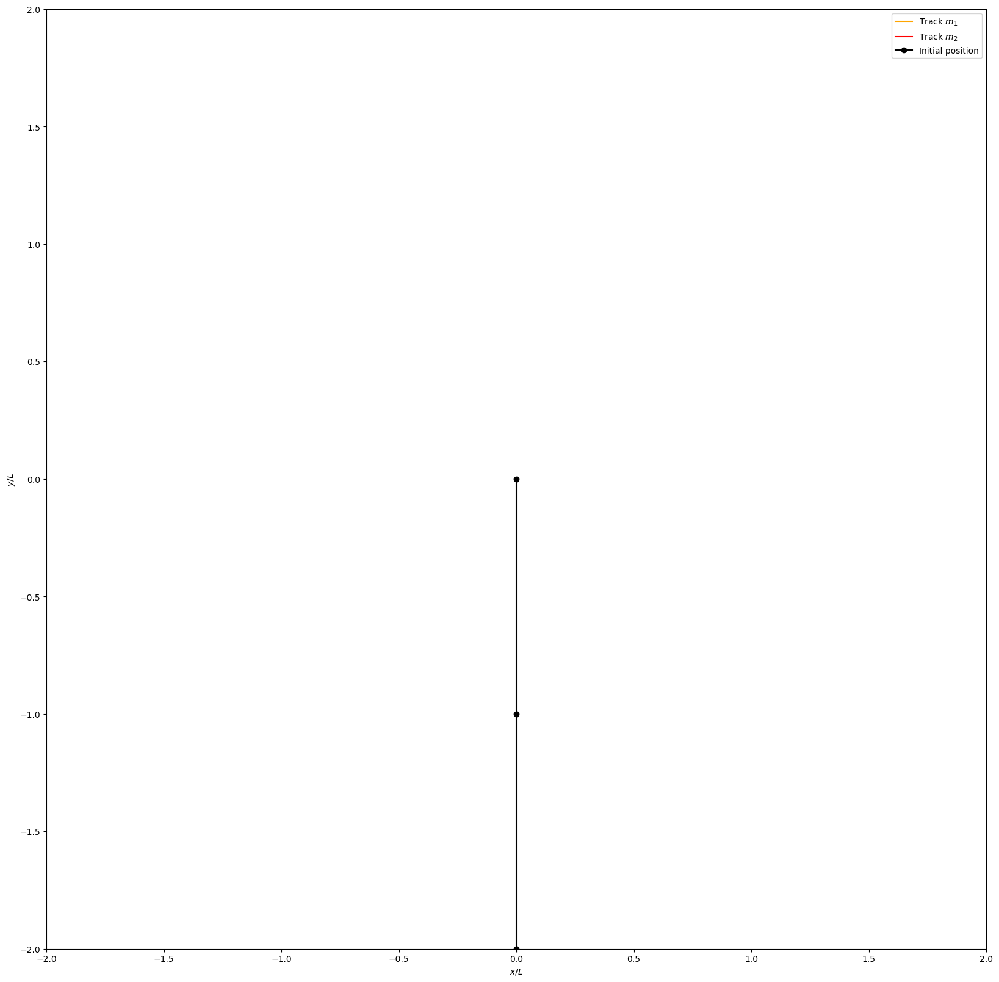

In [2]:
# Define constants
L1, L2 = 1., 1.
m1, m2 = 0.5, 0.5
tmax, dt = 50, 0.01
t = arange(0, tmax+dt, dt)

# Initial conditions(theta1 = theta2 = 0) 
z0 = [0, 0, 0, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta1, w1, theta2, w2 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
plot_position(x1, y1, x2, y2, theta1, theta2, t)

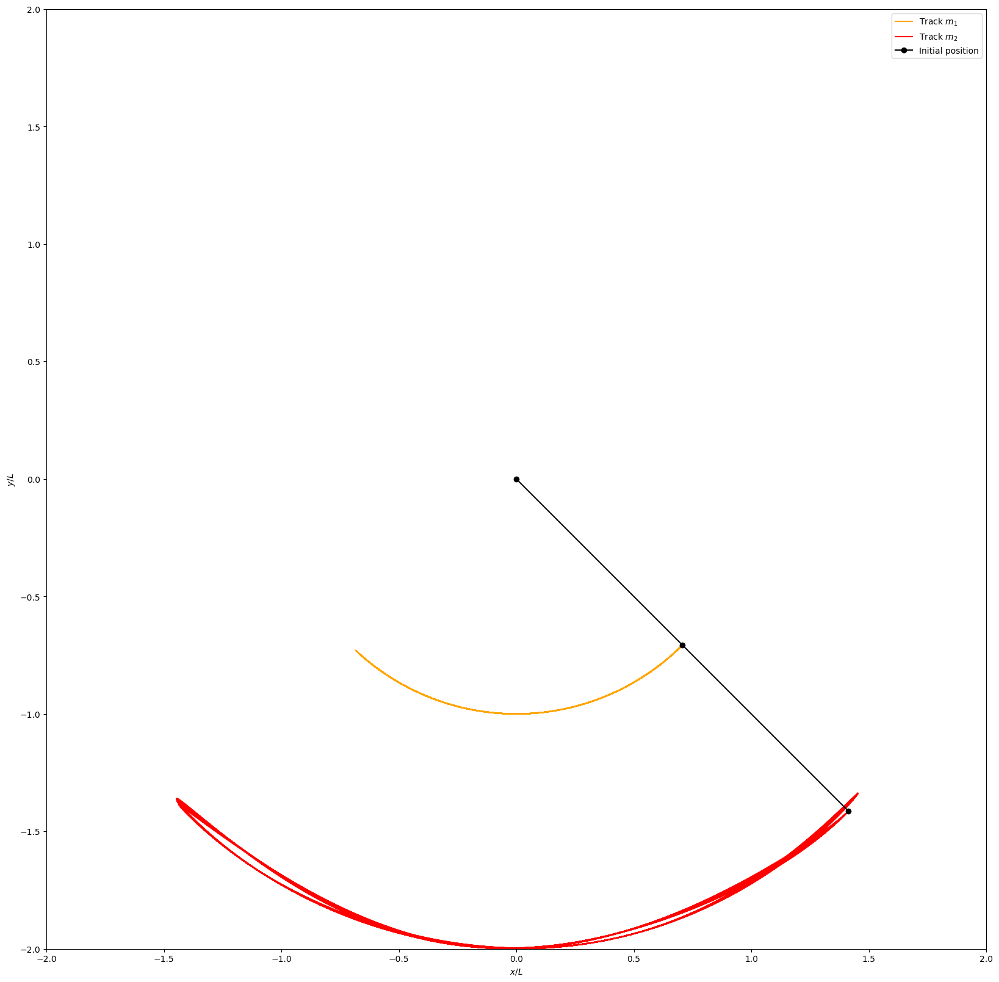

In [3]:
# Define constants
L1, L2 = 1., 1.
m1, m2 = 0.5, 0.5
tmax, dt = 50, 0.01
t = arange(0, tmax+dt, dt)

# Initial conditions( theta1 = theta2 = pi)
z0 = [pi/4, 0, pi/4, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta7, w1, theta8, w2 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta7, w1, theta8, w2, L1, L2)
    
plot_position(x1, y1, x2, y2, theta7, theta8, t)

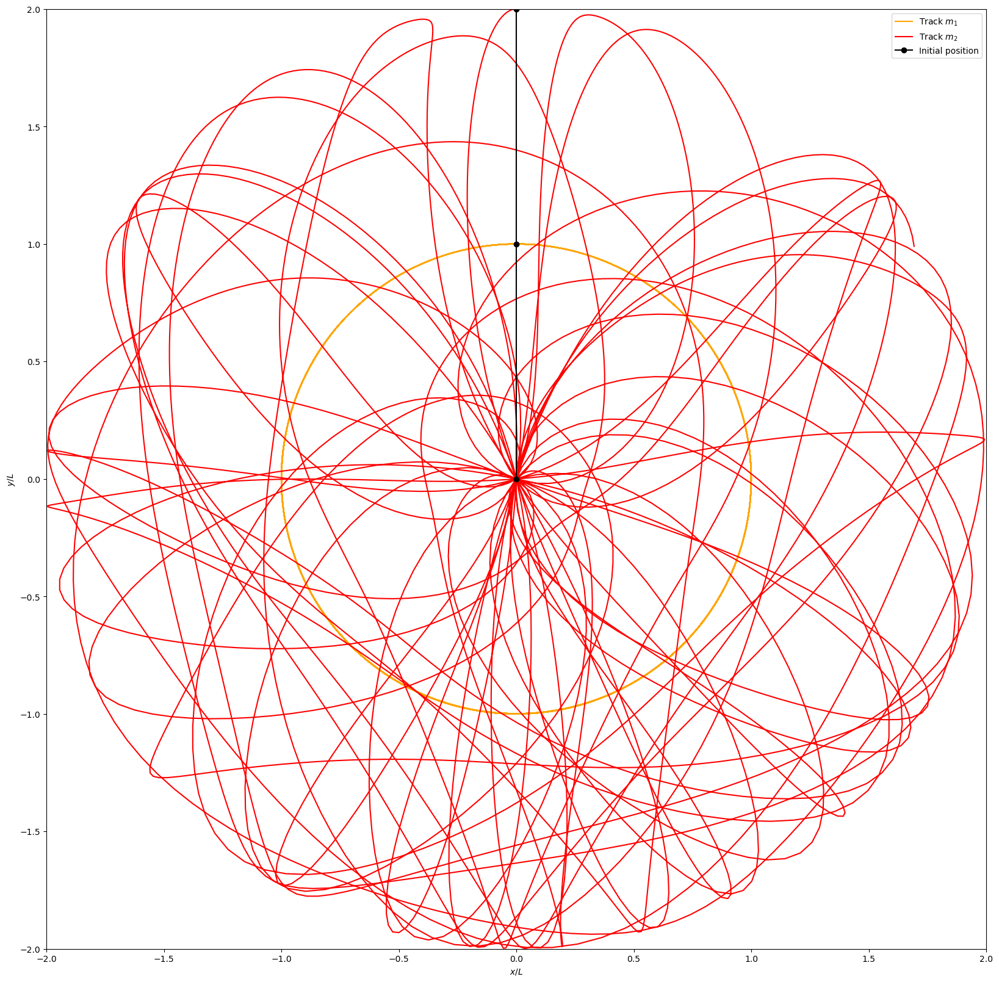

In [4]:
# Define constants
L1, L2 = 1., 1.
m1, m2 = 0.5, 0.5
tmax, dt = 50, 0.01
t = arange(0, tmax+dt, dt)

# Initial conditions( theta1 = theta2 = pi)
z0 = [pi, 0, pi, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta1, w1, theta2, w2 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
plot_position(x1, y1, x2, y2, theta1, theta2, t)

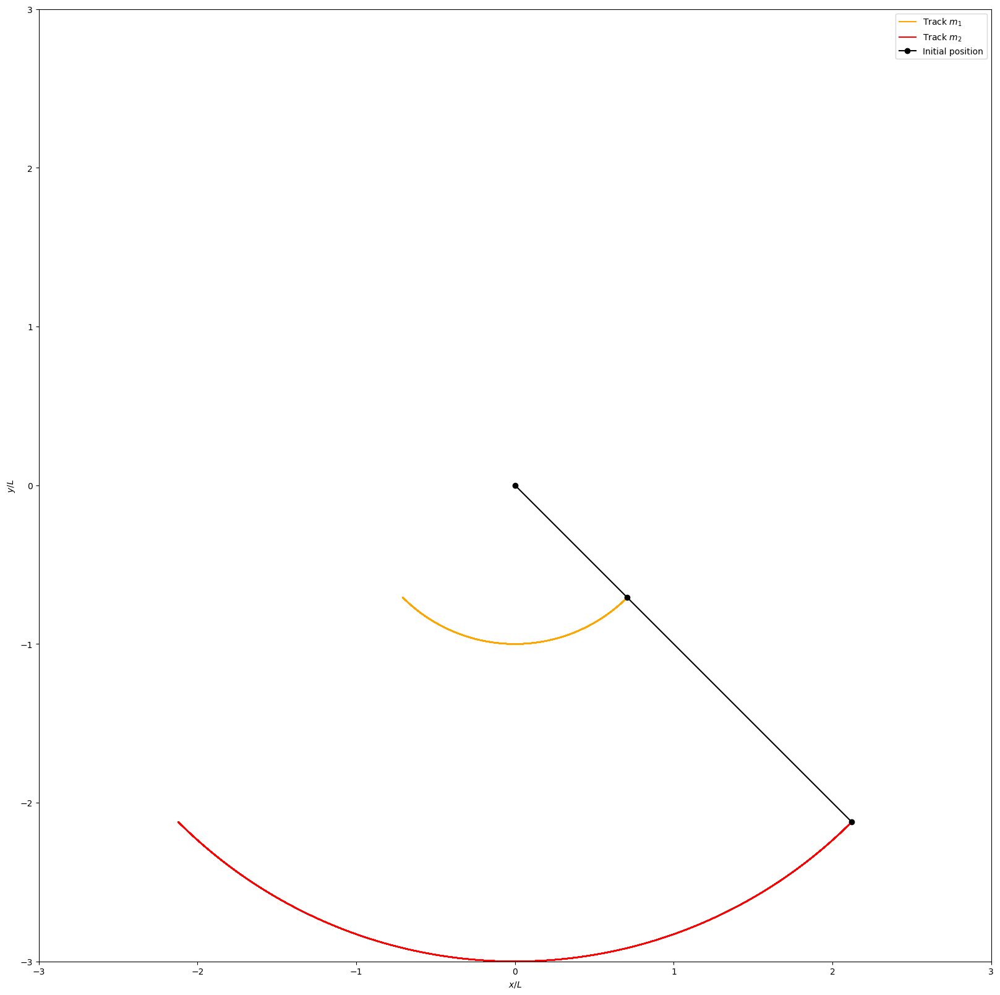

In [5]:
# Define constants
L1, L2 = 1., 2.
m1, m2 = 0.00005, 500
tmax, dt = 50, 0.01
t = arange(0, tmax+dt, dt)

# Initial conditions( theta1 = theta2 = pi)
z0 = [pi/4, 0, pi/4, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta1, w1, theta2, w2 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
plot_position(x1, y1, x2, y2, theta1, theta2, t)

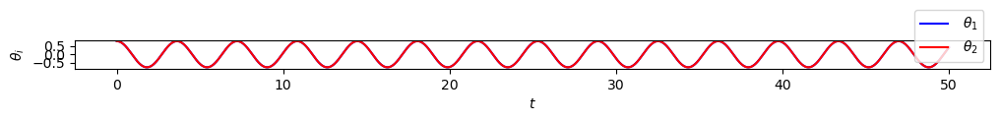

In [6]:
def plot_theta(theta1, theta2, t):
    rcParams['figure.figsize']=[12,12]
    ax = gca()
    ax.set_aspect('equal')
    ax.plot(t, theta1, label=r" $\theta_1$", c = "b")
    ax.plot(t, theta2, label=r" $\theta_2$", c = "r")
    plt.ylabel(r"$\theta_i$")
    plt.xlabel(r"$t$")
    ax.legend()
plot_theta(theta1, theta2, t)
plt.show()

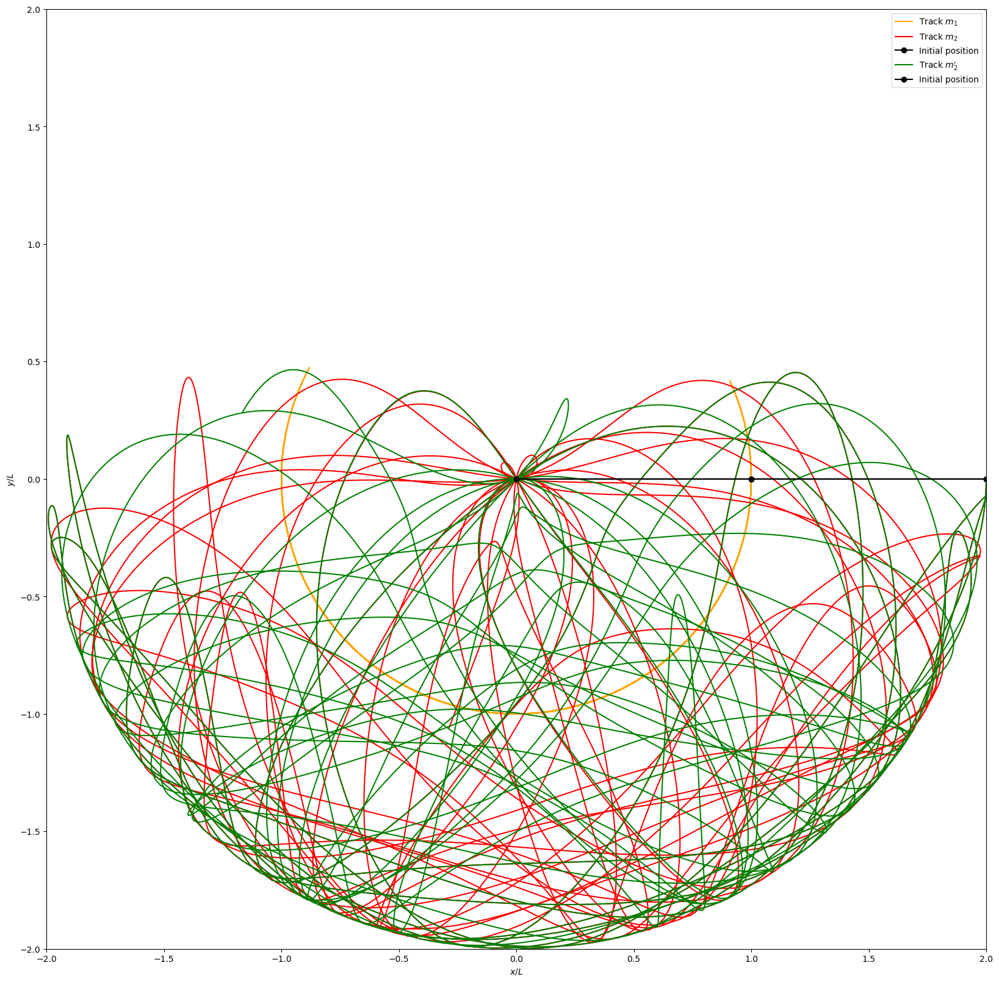

In [7]:
# Define constants
L1, L2 = 1., 1.
m1, m2 = 0.5, 0.5
tmax, dt = 50, 0.01
t = arange(0, tmax+dt, dt)

# Initial conditions
z0 = [pi/2, 0, pi/2, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta1, w1, theta2, w2 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

plot_position(x1, y1, x2, y2, theta1, theta2, t)

# Slight change to theta1 and theta 2
z0 = [pi/2+0.000001, 0, pi/2+0.000001, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta3, w3, theta4, w4 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta3, w3, theta4, w4, L1, L2)
    
plot_position1(x1, y1, x2, y2, theta3, theta4, t)
plt.show()


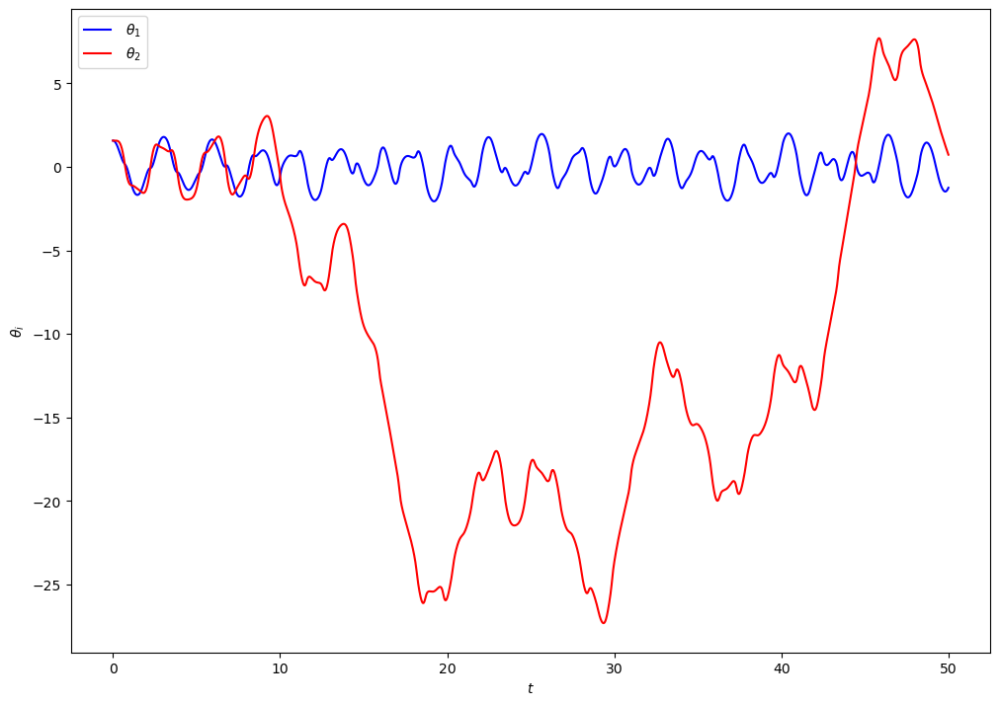

In [8]:
def plot_theta(theta1, theta2, t):
    rcParams['figure.figsize']=[12,12]
    ax = gca()
    ax.set_aspect('equal')
    ax.plot(t, theta1, label=r" $\theta_1$", c = "b")
    ax.plot(t, theta2, label=r" $\theta_2$", c = "r")
    plt.ylabel(r"$\theta_i$")
    plt.xlabel(r"$t$")
    ax.legend()
plot_theta(theta1, theta2, t)
plt.show()

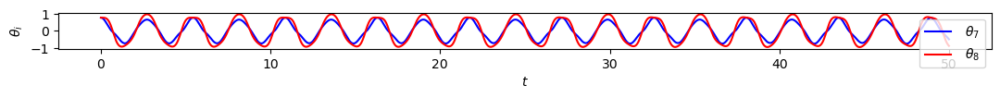

In [9]:
def plot_theta(theta1, theta2, t):
    rcParams['figure.figsize']=[13,13]
    ax = gca()
    ax.set_aspect('equal')
    ax.plot(t, theta1, label=r" $\theta_7$", c = "b")
    ax.plot(t, theta2, label=r" $\theta_8$", c = "r")
    plt.ylabel(r"$\theta_i$")
    plt.xlabel(r"$t$")
    ax.legend()
plot_theta(theta7, theta8, t)
plt.show()

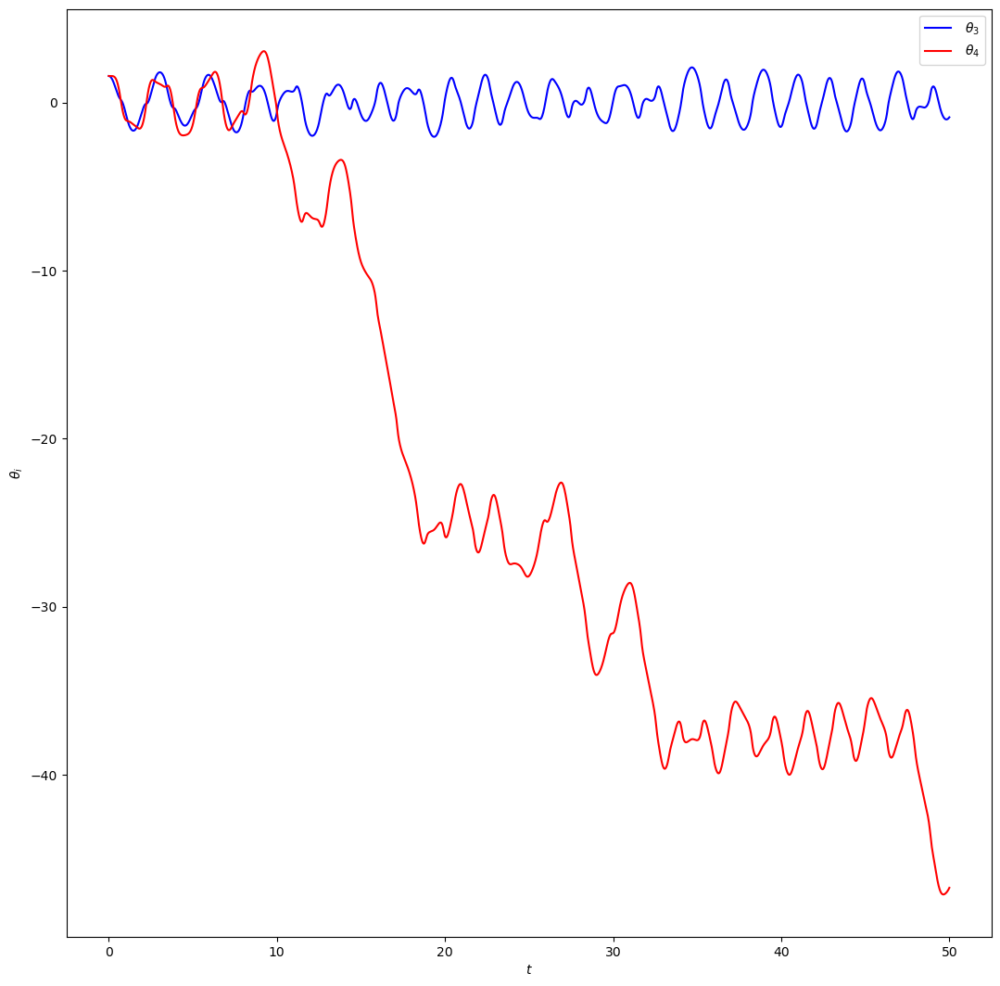

In [10]:
def plot_theta(theta1, theta2, t):
    rcParams['figure.figsize']=[13,13]
    ax = gca()
    ax.set_aspect('equal')
    ax.plot(t, theta1, label=r" $\theta_3$", c = "b")
    ax.plot(t, theta2, label=r" $\theta_4$", c = "r")
    plt.ylabel(r"$\theta_i$")
    plt.xlabel(r"$t$")
    ax.legend()
plot_theta(theta3, theta4, t)
plt.show()

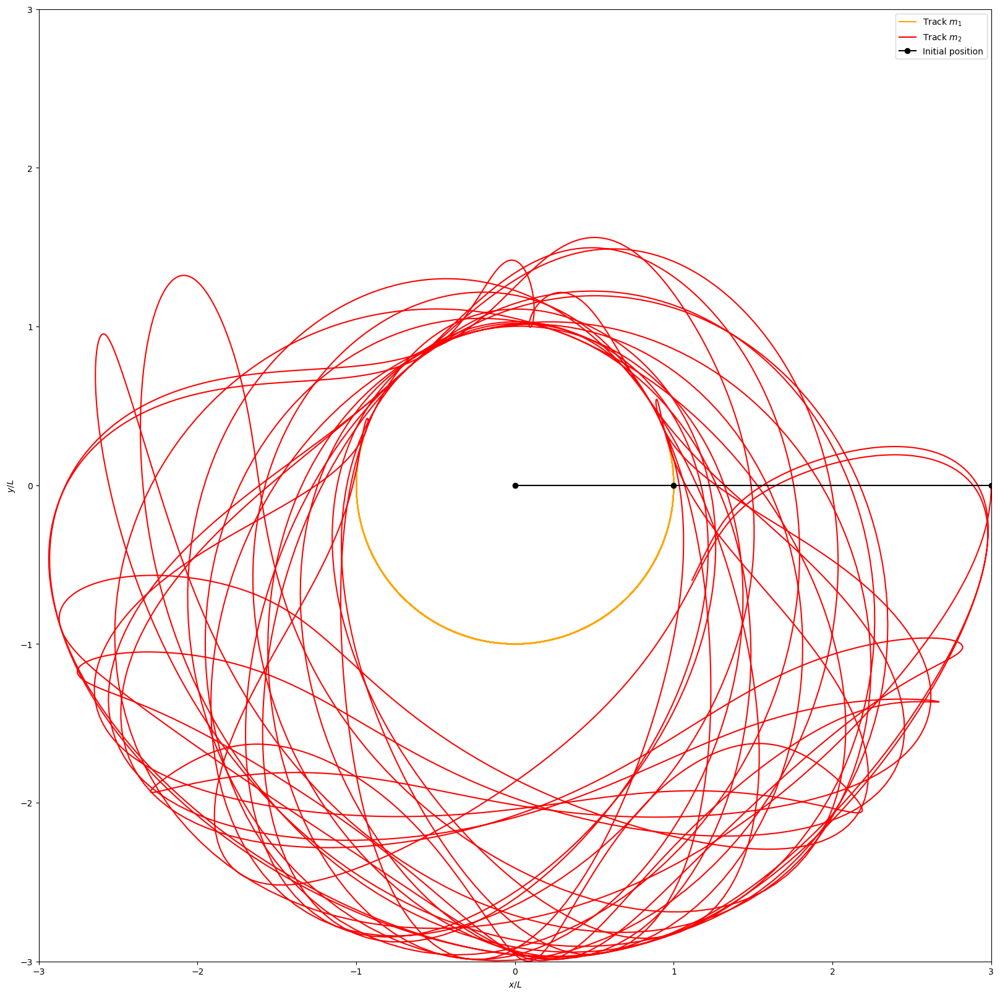

In [11]:
# Define new constant with different mass and length:
L1, L2 = 1., 2.
m1, m2 = 2.25, 0.5
tmax, dt = 50, 0.01
t = arange(0, tmax+dt, dt)

# Initial conditions
z0 = [pi/2, 0, pi/2, 0]

# Perform simulation
z = odeint(RHS, z0, t, args=(L1, L2, m1, m2, g))

# Extract result
theta5, w5, theta6, w6 = z[:,0], z[:,1], z[:,2], z[:,3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta5, w5, theta6, w6, L1, L2)
    
plot_position(x1, y1, x2, y2, theta5, theta6, t)
plt.show()

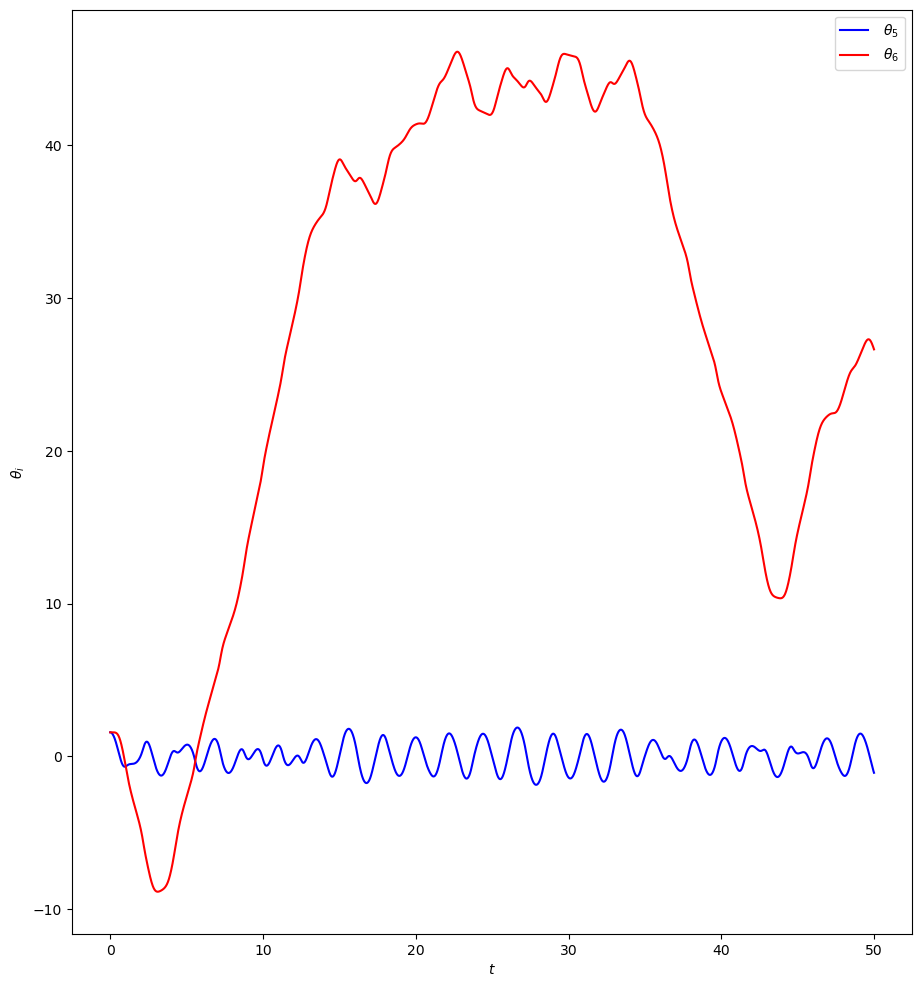

In [12]:
def plot_theta(theta1, theta2, t):
    rcParams['figure.figsize']=[12,12]
    ax = gca()
    ax.set_aspect('equal')
    ax.plot(t, theta1, label=r" $\theta_5$", c = "b")
    ax.plot(t, theta2, label=r" $\theta_6$", c = "r")
    plt.ylabel(r"$\theta_i$")
    plt.xlabel(r"$t$")
    ax.legend()
plot_theta(theta5, theta6, t)
plt.show()

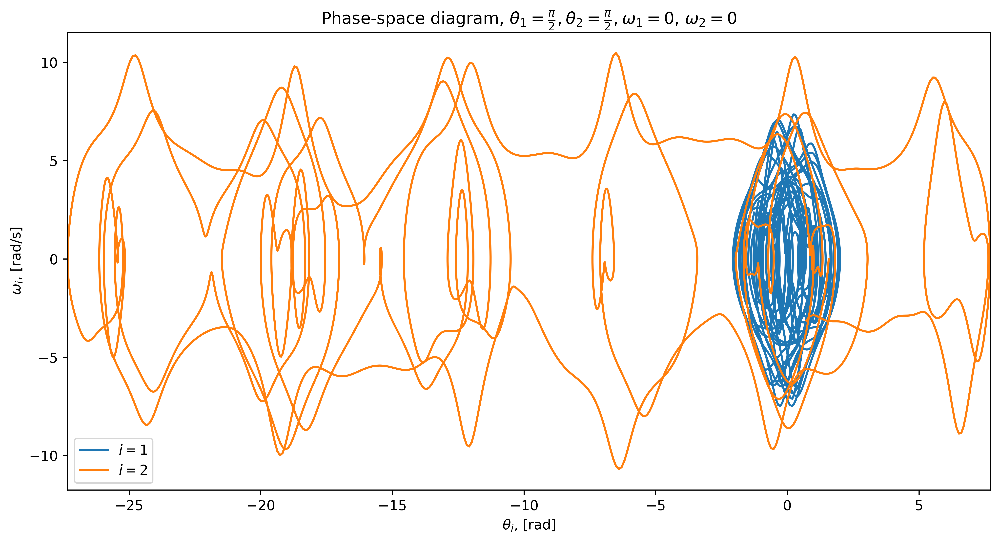

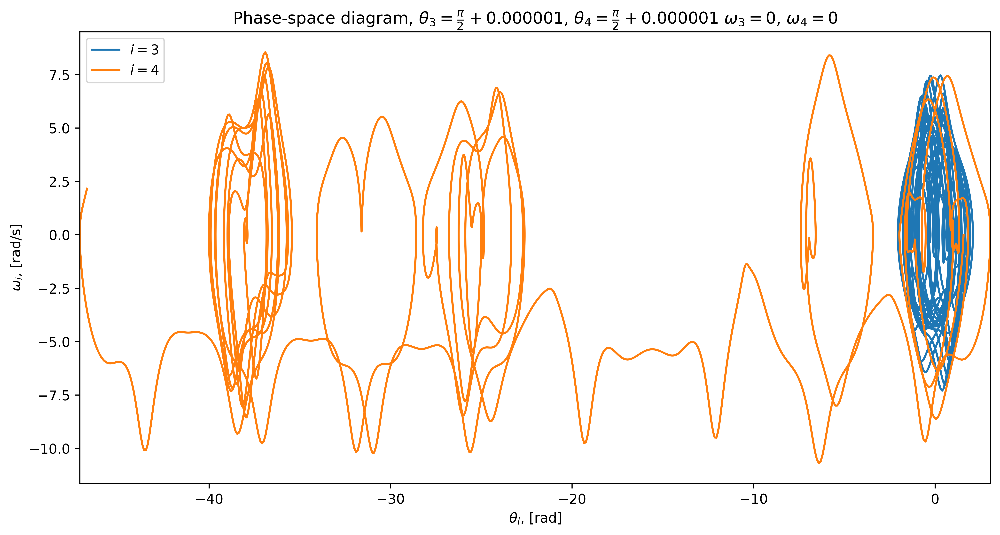

In [13]:
def plot_phasespace(theta1, w1, theta2, w2):
    """
    Plot the phase space diagram from the given
    theta1, w1, theta2, w2
    """
    plt.figure(figsize=(2*figsize, figsize), dpi=dpi)
    plt.title(r"Phase-space diagram, $\theta_{1}=\frac{\pi}{2}, $$\theta_{2}=\frac{\pi}{2}, $"
             + r"$\omega_{1}=0$, $\omega_{2}=0$")
    plt.plot(theta1, w1, label=r"$i=1$")
    plt.plot(theta2, w2, label=r"$i=2$")
    plt.legend()
    plt.xlabel(r"$\theta_i$, [rad]")
    plt.ylabel(r"$\omega_i$, [rad/s]")
    xlim = [np.min(theta1), np.max(theta1), np.min(theta2), np.max(theta2)]
    plt.xlim(np.min(xlim), np.max(xlim))
    plt.show()
plot_phasespace(theta1, w1, theta2, w2)
show()

def plot_phasespace1(theta1, w1, theta2, w2):
    plt.figure(figsize=(2*figsize, figsize), dpi=dpi)
    plt.title(r"Phase-space diagram, $\theta_{3}=\frac{\pi}{2}+0.000001$, $\theta_{4}=\frac{\pi}{2}+0.000001$ "
             + r"$\omega_{3}=0$, $\omega_{4}=0$")
    plt.plot(theta1, w1, label=r"$i=3$")
    plt.plot(theta2, w2, label=r"$i=4$")
    plt.legend()
    plt.xlabel(r"$\theta_i$, [rad]")
    plt.ylabel(r"$\omega_i$, [rad/s]")
    xlim = [np.min(theta1), np.max(theta1), np.min(theta2), np.max(theta2)]
    plt.xlim(np.min(xlim), np.max(xlim))
    plt.show()
plot_phasespace1(theta3, w3, theta4, w4)
show()

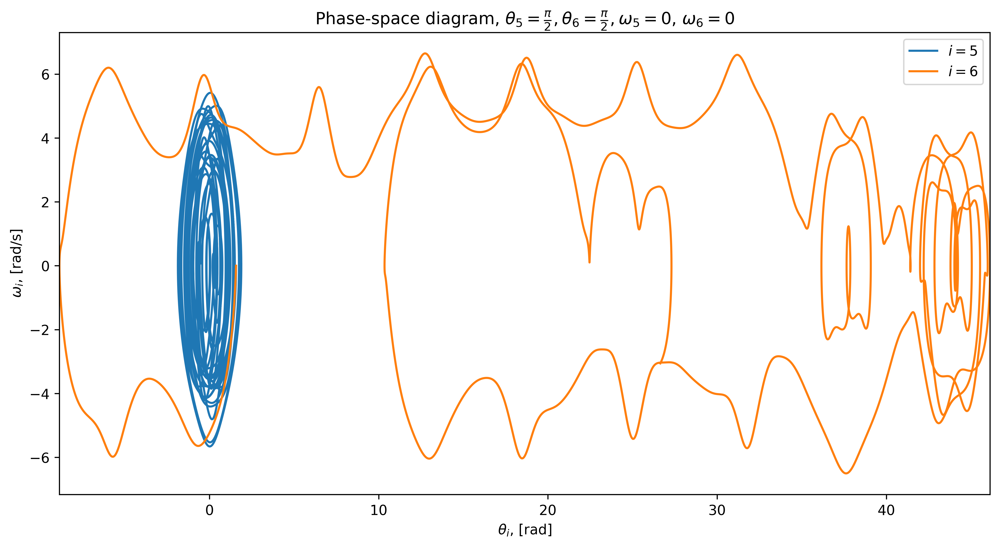

In [14]:
def plot_phasespace3(theta1, w1, theta2, w2):
    plt.figure(figsize=(2*figsize, figsize), dpi=dpi)
    plt.title(r"Phase-space diagram, $\theta_{5}=\frac{\pi}{2}, $$\theta_{6}=\frac{\pi}{2}, $"
             + r"$\omega_{5}=0$, $\omega_{6}=0$")
    plt.plot(theta1, w1, label=r"$i=5$")
    plt.plot(theta2, w2, label=r"$i=6$")
    plt.legend()
    plt.xlabel(r"$\theta_i$, [rad]")
    plt.ylabel(r"$\omega_i$, [rad/s]")
    xlim = [np.min(theta1), np.max(theta1), np.min(theta2), np.max(theta2)]
    plt.xlim(np.min(xlim), np.max(xlim))
    plt.show()
plot_phasespace3(theta5, w5, theta6, w6)
show()

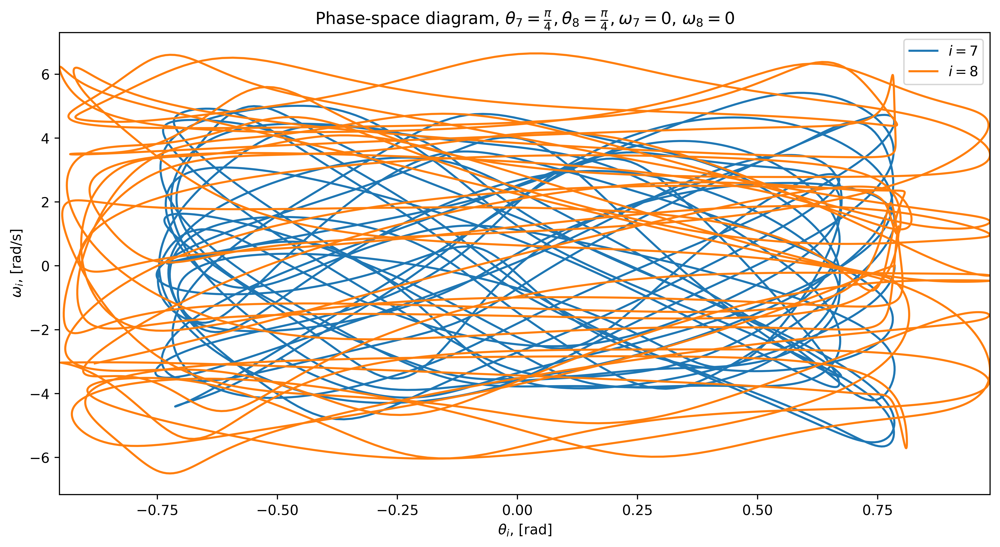

In [15]:
def plot_phasespace3(theta1, w1, theta2, w2):
    plt.figure(figsize=(2*figsize, figsize), dpi=dpi)
    plt.title(r"Phase-space diagram, $\theta_{7}=\frac{\pi}{4}, $$\theta_{8}=\frac{\pi}{4}, $"
             + r"$\omega_{7}=0$, $\omega_{8}=0$")
    plt.plot(theta1, w1, label=r"$i=7$")
    plt.plot(theta2, w2, label=r"$i=8$")
    plt.legend()
    plt.xlabel(r"$\theta_i$, [rad]")
    plt.ylabel(r"$\omega_i$, [rad/s]")
    xlim = [np.min(theta1), np.max(theta1), np.min(theta2), np.max(theta2)]
    plt.xlim(np.min(xlim), np.max(xlim))
    plt.show()
plot_phasespace3(theta7, w5, theta8, w6)
show()